In [1]:
import sys

In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [3]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [4]:
import os
os.getcwd()

'/Volumes/groups/tanaka/People/current/jiwang/projects/RA_competence/scripts'

In [5]:
input_Dir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/"
outDir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/"

In [6]:
data_seuratObj = os.path.join(input_Dir, 
                              "RNAmatrix_umap_alevin.spliced_unspliced_RA_downsample_28k_rmCellCycle.correlatedGenes.h5ad")
adata = sc.read_h5ad(data_seuratObj, chunk_size=6000)

In [7]:
adata

AnnData object with n_obs × n_vars = 28000 × 15157
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features'
    obsm: 'X_umap'
    layers: 'spliced', 'unspliced'

In [8]:
adata.layers.keys()

KeysView(Layers with keys: spliced, unspliced)

In [9]:
adata.obs['condition']= adata.obs['condition'].astype('category') # change the condition into category type
adata.obs['celltypes']= adata.obs['celltypes'].astype('category')
adata.obs['clusters']= adata.obs['clusters'].astype('category')

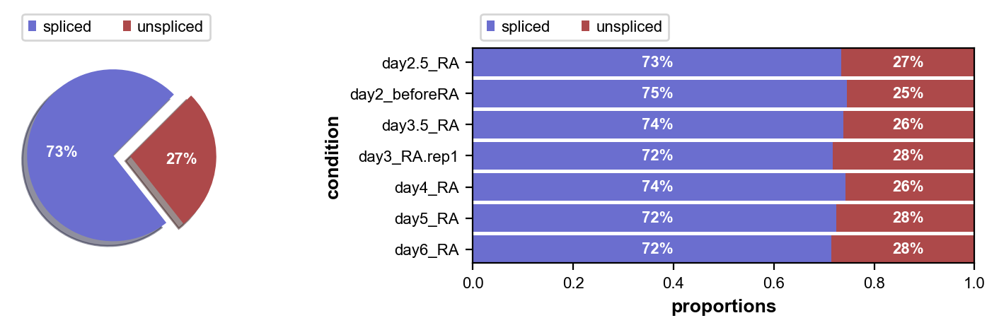

In [10]:
#adata = cr.datasets.pancreas()

scv.pl.proportions(adata, groupby='condition')


In [11]:
scv.pp.filter_and_normalize(adata, 
                            min_shared_counts=20, n_top_genes=3000, 
                            flavor = 'seurat', 
                            layers_normalize={'X', 'spliced', 'unspliced'}) # by specifying layers_normalize to renormalize the counts 
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 3506 genes that are detected 20 counts (shared).
Normalized count data: X, unspliced, spliced.
Extracted 3000 highly variable genes.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [12]:
scv.tl.recover_dynamics(adata, n_jobs=10, max_iter=10) # slow step and require high memory ~120G, so it is better to start the jupterlab with 150G RAM (~15-20mins)

recovering dynamics (using 10/10 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:09:42) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [13]:
adata 

AnnData object with n_obs × n_vars = 28000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling'
    uns: 'pca', 'neighbors', 'recover_dynamics'
    obsm: 'X_umap', 'X_pca'
    var

In [14]:
# save the velocity result
#adata.write(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), compression="gzip")

In [15]:
# reload the calculated velocity from tl.recover_dynamics
#adata = sc.read_h5ad(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), chunk_size=6000)

In [16]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:28) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:59) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


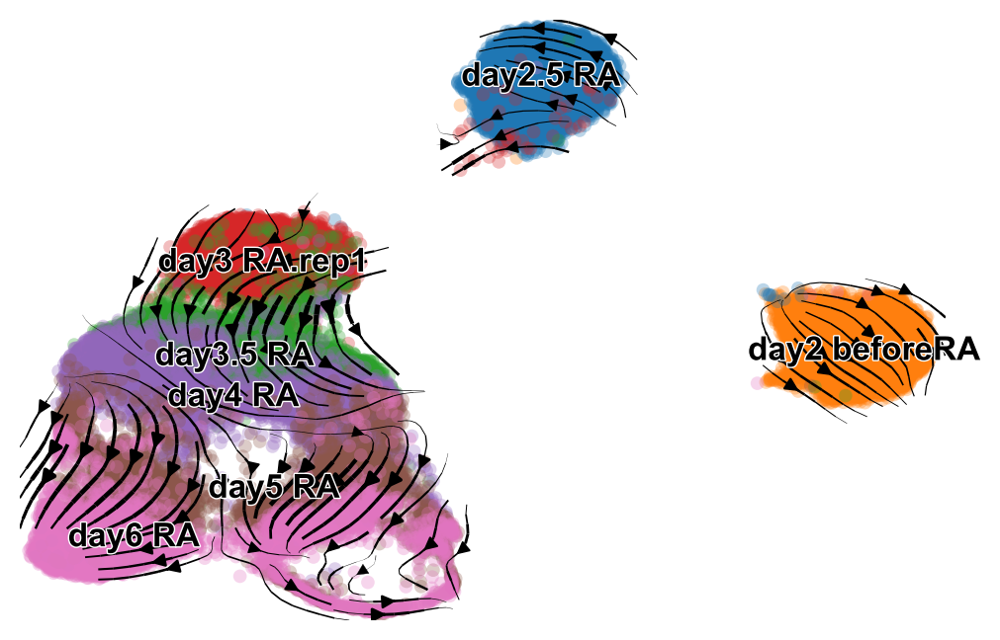

In [17]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_stream_model_dynamical_stream_top3000.pdf


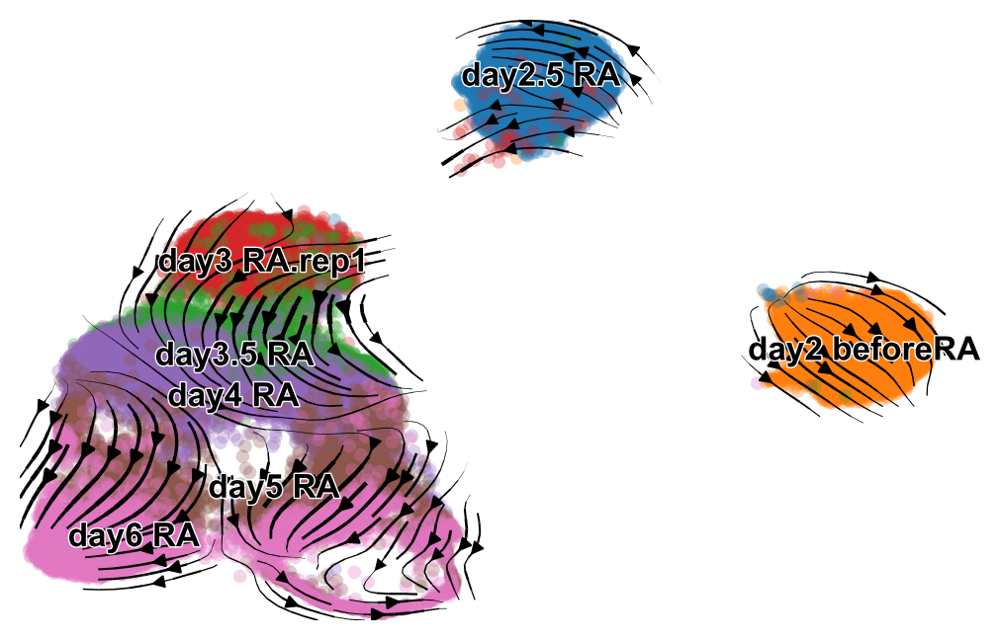

In [18]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_dynamical_stream_top3000.pdf"))

In [19]:
#scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity(adata, mode="steady_state")

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:01:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


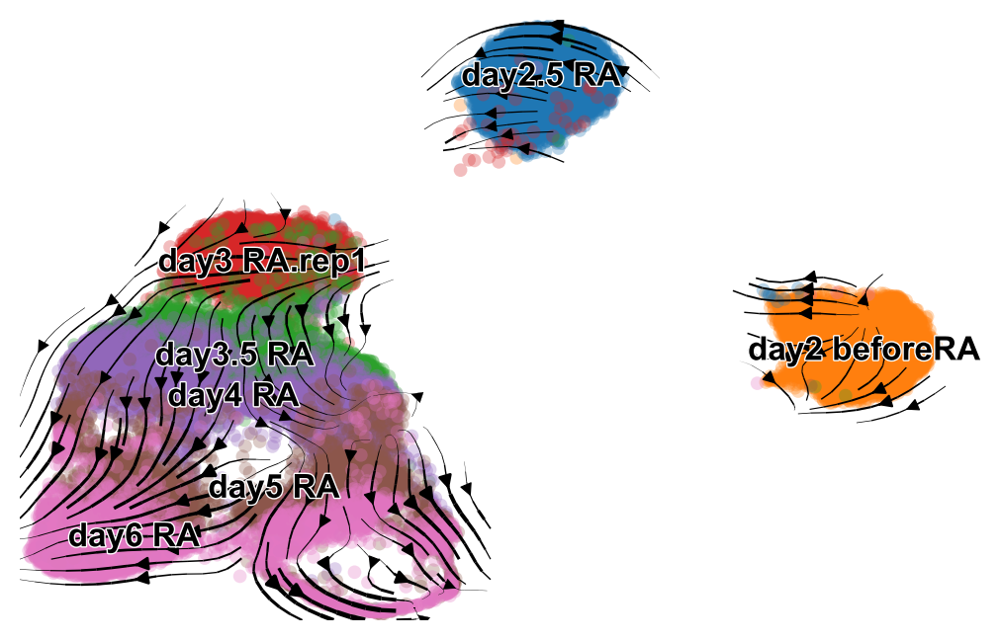

In [20]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_stream_model_steadystat_stream_top3000.pdf


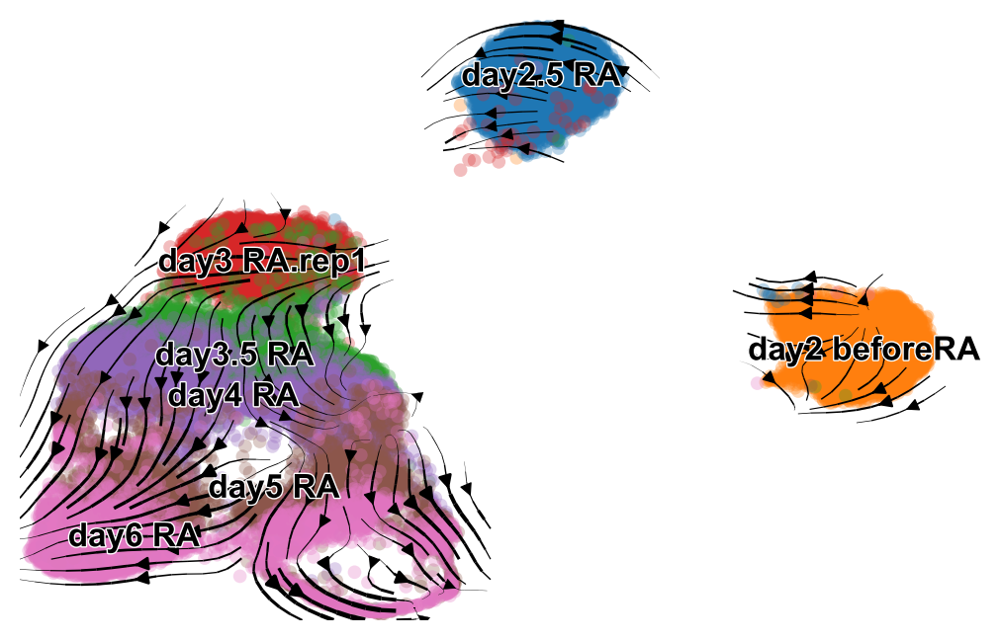

In [21]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_steadystat_stream_top3000.pdf"))

computing velocities
    finished (0:00:13) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:02:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


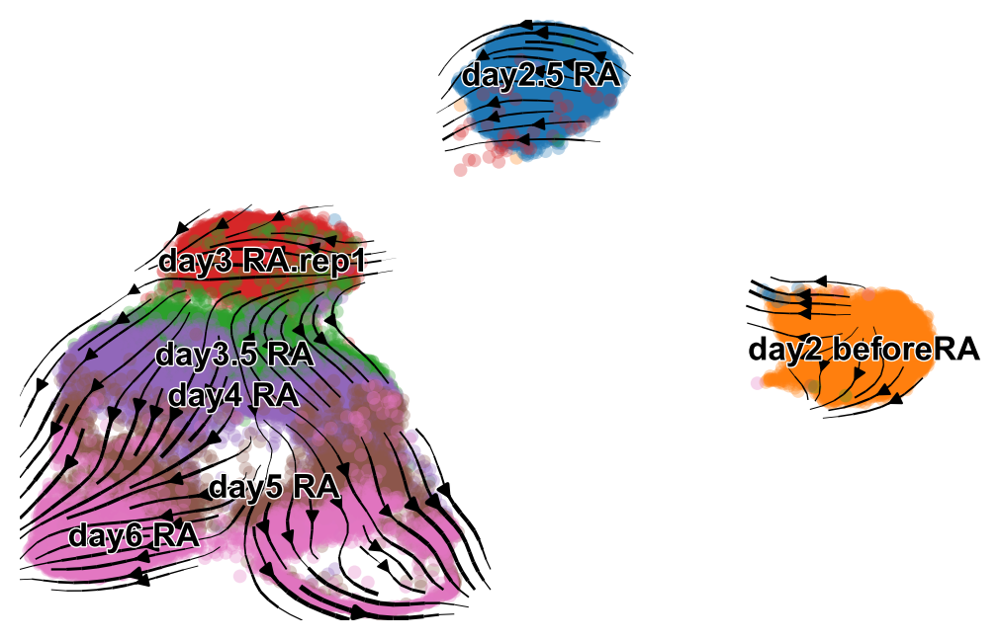

In [22]:
scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.beforeRA.to.d6_rm.weired.clusters/RNAvelocity_model_stochastic_stream_top3000.pdf


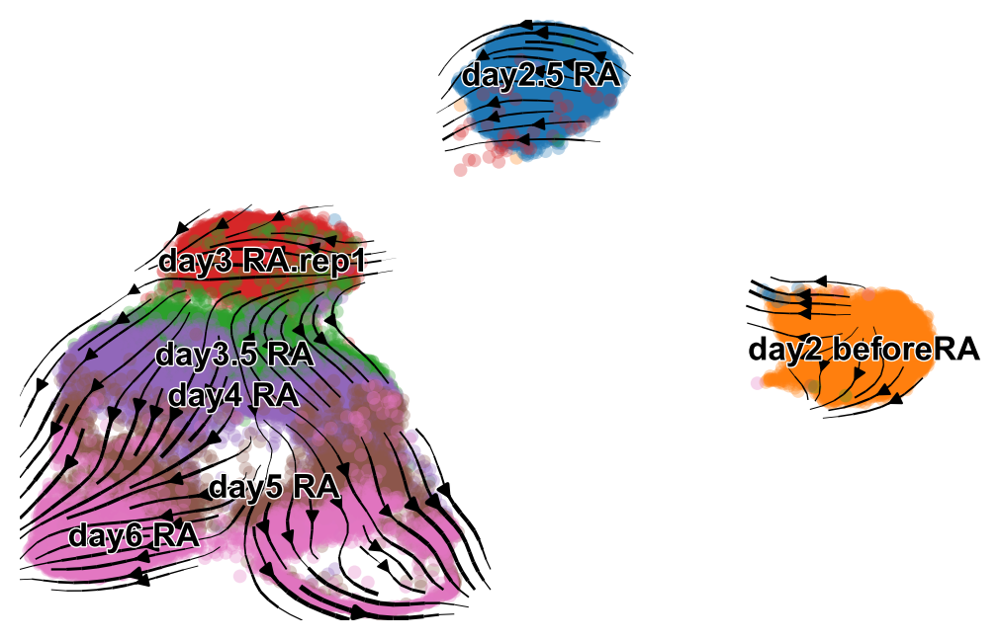

In [23]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_model_stochastic_stream_top3000.pdf"))

In [24]:
# compare three models and it seems that the steady state works relatively better for root and terminal cells

In [25]:
#scv.tl.velocity(adata, mode="dynamical") # test dynamical model
#scv.tl.velocity(adata, mode="steady_state")
scv.tl.velocity(adata, mode="stochastic") # test dynamical model
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:02:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


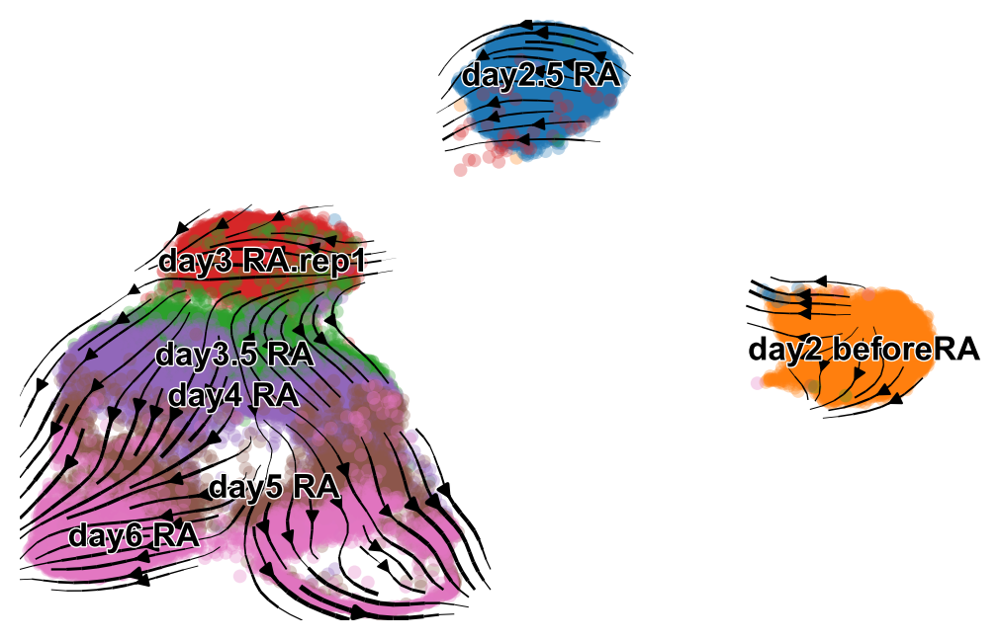

In [26]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

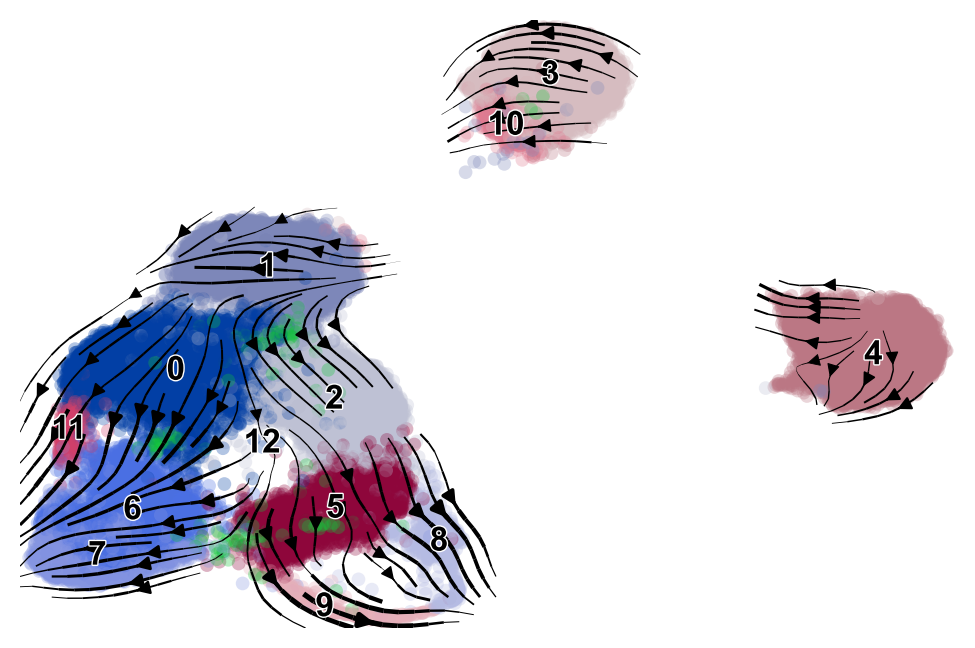

In [27]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

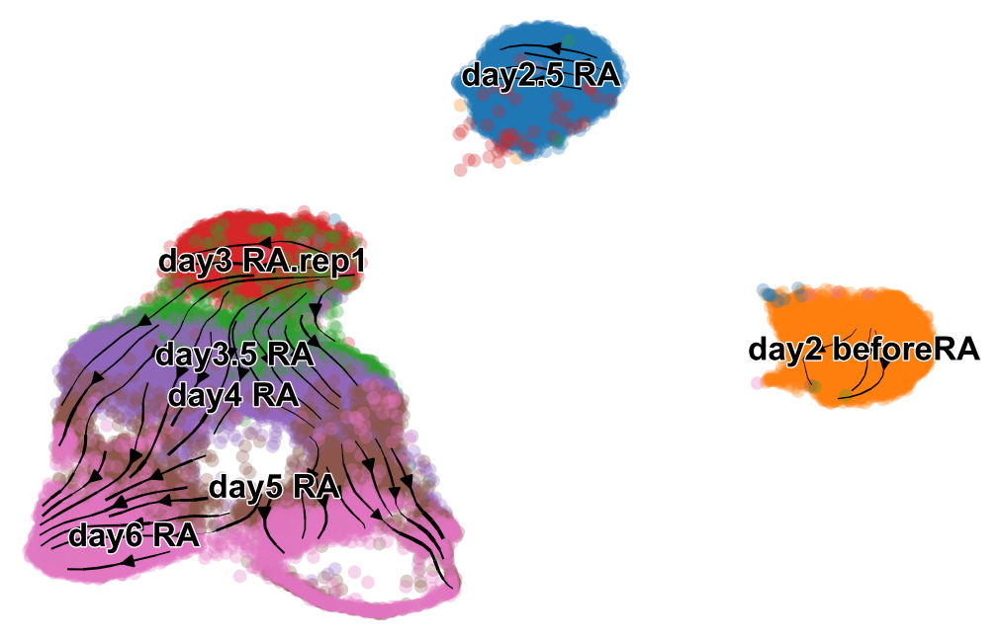

In [28]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.1, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

In [29]:
adata

AnnData object with n_obs × n_vars = 28000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity_gamma', 'velocity_qreg_rat

computing velocity embedding
    finished (0:00:08) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


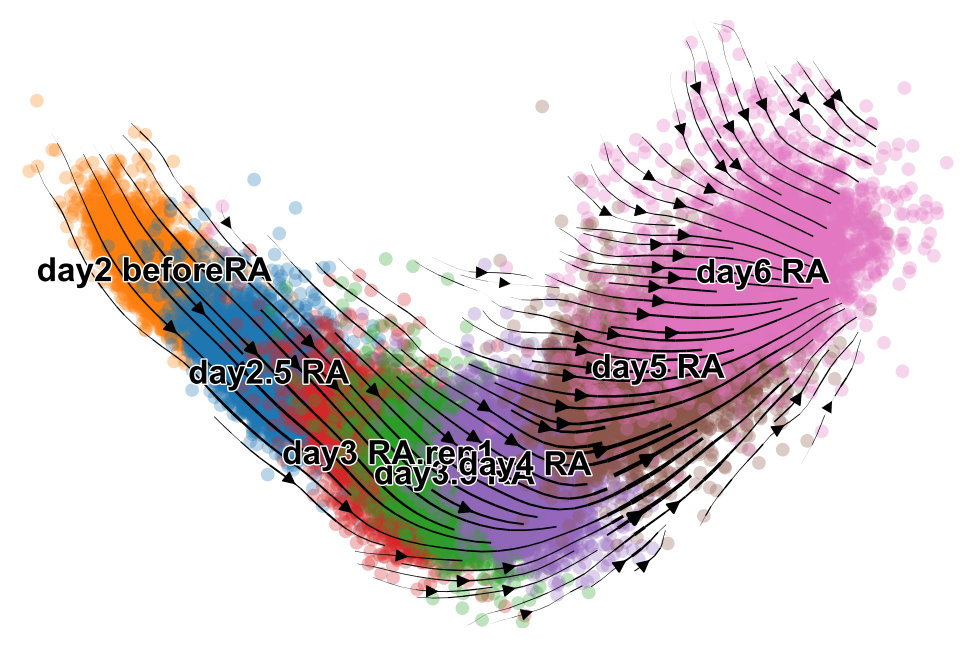

In [30]:
scv.pl.velocity_embedding_stream(
    adata, basis="pca", smooth=0.4, min_mass=0.5,
    legend_fontsize=12, title="", color = "condition"
)

In [31]:
print(adata.var.velocity_genes.sum()) # check the genes used for RNA velocity

1470


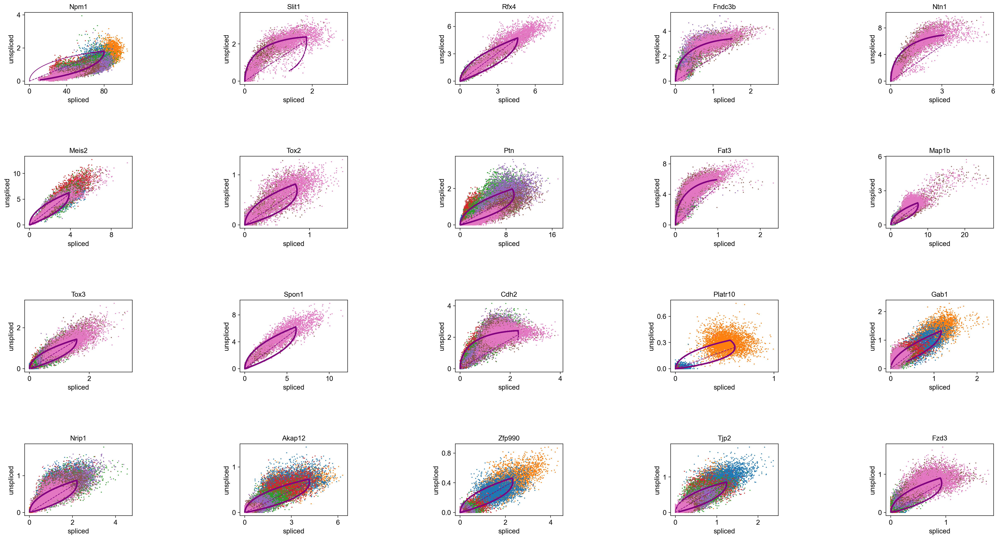

In [32]:
## top genes
top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index[:20]
scv.pl.scatter(adata, basis=top_genes, color="condition", wspace=1, hspace=1, nrows=4, ncols=5)

In [33]:
# scv.pl.velocity_embedding(adata, basis="umap", arrow_length=3, arrow_size=2, dpi=120, color = "condition")
# scv.pl.velocity_embedding(adata, basis='umap',color='cell.type.fine',arrow_length=5)
# scv.pl.velocity_embedding_grid(adata, basis='umap',color='seurat_clusters',arrow_length=5)

In [34]:
## latent time and dpt pseudotime were not relying on the cellrank 
#scv.tl.terminal_states(adata)
#scv.tl.latent_time(adata)
#scv.pl.scatter(adata, color='latent_time',color_map='gnuplot', size=80)
#scv.pl.scatter(adata, color=[ 'root_cells', 'end_points'])

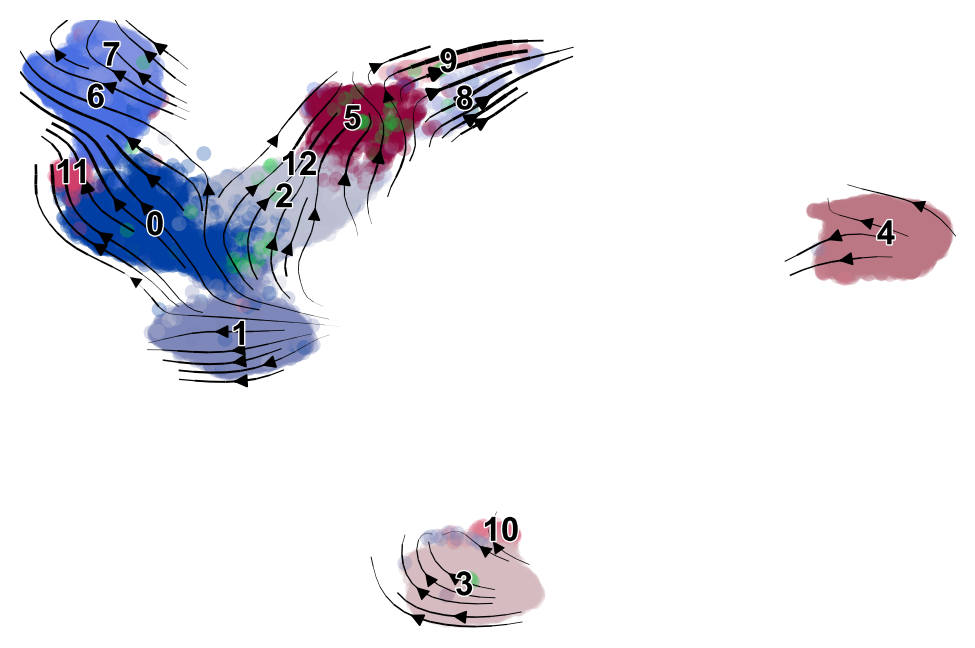

In [65]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [66]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_stea

In [67]:
# dpt_pseudotime require the root specification
adata.obs['root_cells'] = np.flatnonzero(adata.obs['clusters']  == '4')[0]

In [68]:
scv.tl.terminal_states(adata)

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


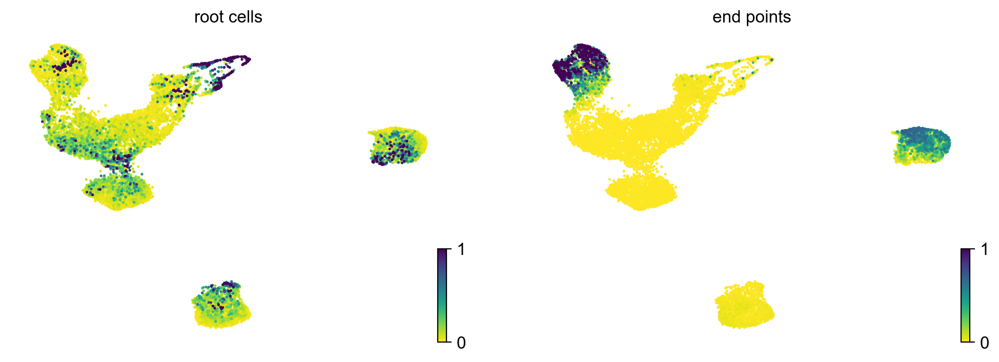

In [80]:
scv.pl.scatter(adata, color=['root_cells', 'end_points'])

In [60]:
adata.obs['iend'] = np.flatnonzero(adata.obs['clusters']  == '7' or adata.obs['clusters']  == '8' 
                                  or adata.obs['clusters']  == '9')[0]

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [116]:
sc.tl.diffmap(adata, n_dcs=15)

TypeError: diffmap() got an unexpected keyword argument 'n_dcs'

In [ ]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '4')[0]

In [77]:
sc.tl.dpt(adata, n_branchings = 2)


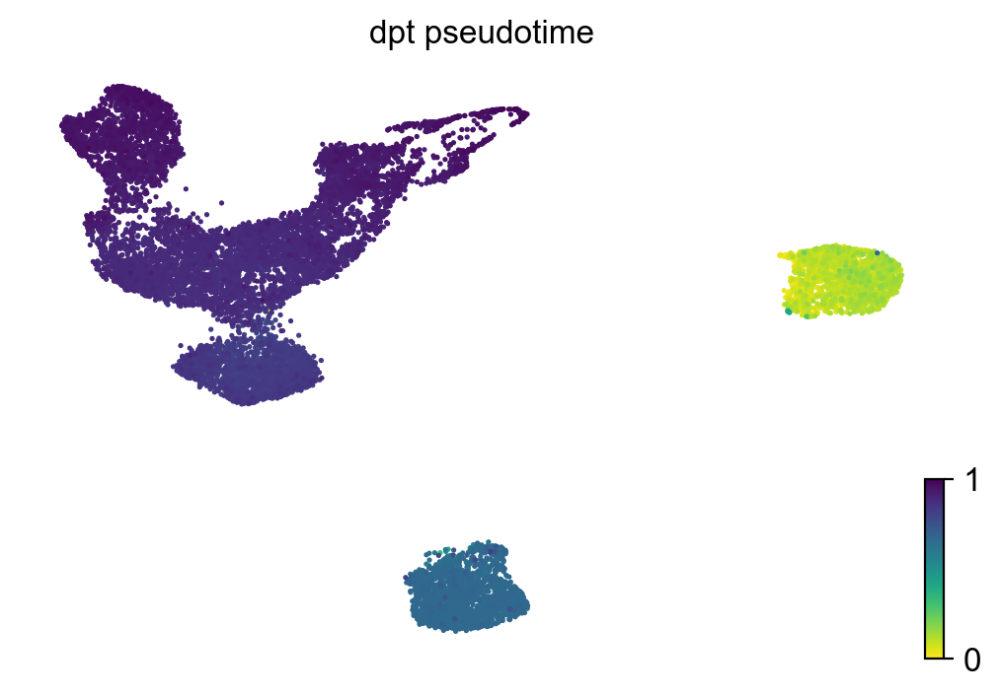

In [115]:
scv.pl.scatter(adata, basis="umap", c="dpt_pseudotime")

In [46]:
scv.tl.terminal_states(adata)

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


In [71]:
scv.tl.latent_time(adata, root_key = 'iroot')

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root cell 0 as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


In [72]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_stea

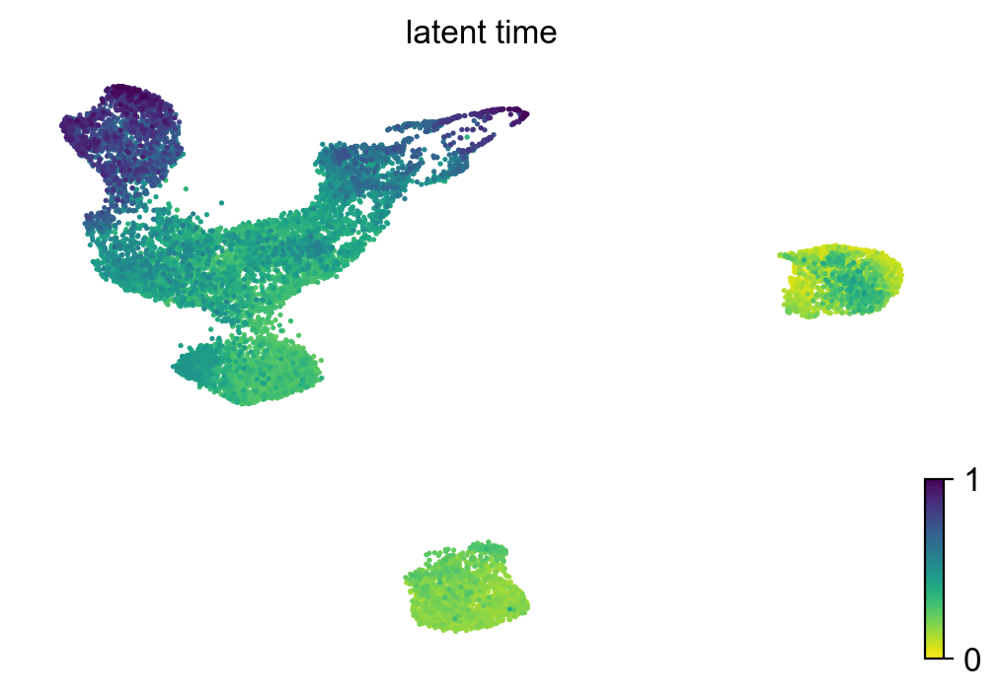

In [79]:
scv.pl.scatter(adata, basis="umap", c="latent_time")

In [50]:
adata.obs[['dpt_pseudotime', 'latent_time','condition', 'cell.id', 'velocity_pseudotime']]

,dpt_pseudotime,latent_time,condition,cell.id,velocity_pseudotime
GATTCGAAGATCACTC-1_1_1_1_1_1_1_1_1,0.000000,0.042731,day2_beforeRA,GATTCGAAGATCACTC-1_day2_beforeRA_196324,0.086113
TGATGCAAGCTCCATA-1_1_1_1_1_1_1_1_1,0.135136,0.078252,day2_beforeRA,TGATGCAAGCTCCATA-1_day2_beforeRA_196324,0.087935
CGGAATTCAGGGACTA-1_1_1_1_1_1_1_1_1,0.007317,0.046734,day2_beforeRA,CGGAATTCAGGGACTA-1_day2_beforeRA_196324,0.066029
GTTGTAGGTGCATACT-1_1_1_1_1_1_1_1_1,0.038690,0.039439,day2_beforeRA,GTTGTAGGTGCATACT-1_day2_beforeRA_196324,0.047193
TCGGGCATCAGAACCT-1_1_1_1_1_1_1_1_1,0.083650,0.060986,day2_beforeRA,TCGGGCATCAGAACCT-1_day2_beforeRA_196324,0.066727
...,...,...,...,...,...
TCGTGGGCAGGAGGAG-1_2,0.938653,0.823117,day6_RA,TCGTGGGCAGGAGGAG-1_day6_RA_196338,0.962582
AGCGTCGGTAATGCTC-1_2,0.969505,0.855554,day6_RA,AGCGTCGGTAATGCTC-1_day6_RA_196338,0.954993
GAGTGTTGTAATGCGG-1_2,0.927786,0.554248,day6_RA,GAGTGTTGTAATGCGG-1_day6_RA_196338,0.965947
GAATCGTGTGCGTCGT-1_2,0.906560,0.600467,day6_RA,GAATCGTGTGCGTCGT-1_day6_RA_196338,0.961242


In [51]:
adata.obs[['dpt_pseudotime', 'latent_time', 
           'condition', 'cell.id', 
           'velocity_pseudotime']].to_csv(os.path.join(outDir, 
                                                       "scvelo_dpt_pseudotime_latenttime_downsample.28k.csv"))

In [52]:
# save the scvelo result
adata
#adata.write(os.path.join(outDir,'my_results_28k.cells_scvelo_stochastic.h5ad'), compression="gzip")

AnnData object with n_obs × n_vars = 28000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_varian

In [6]:
# double check the estimated pseudotime and latent time
adata = scv.read(os.path.join(outDir,'my_results_14k.cells_scvelo_stochastic.h5ad'))

In [7]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_stea

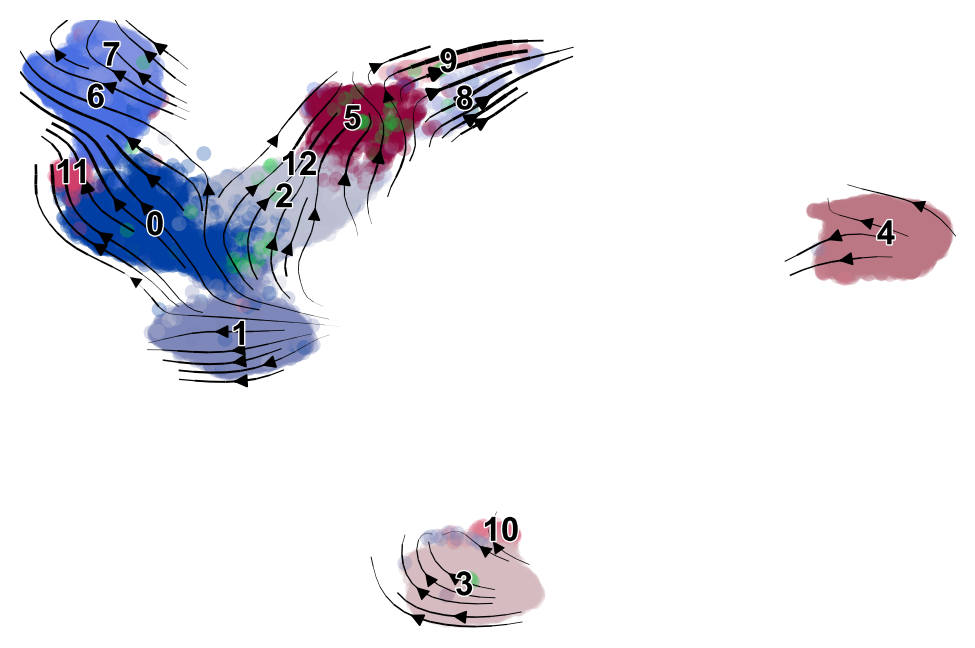

In [8]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [12]:
cr.tl.terminal_states(adata, 
                      n_states = 2, 
                      cluster_key="clusters", 
                      mode = 'monte_carlo'
                      #weight_connectivities=0.2, 
                      force_recompute = True,
                     n_jobs = -1)

/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [00:12<00:00, 1118.75cell/s]


Setting `softmax_scale=15.8728`


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [00:12<00:00, 1114.04cell/s]

    Finish (0:00:27)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`


    Finish (0:00:00)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999800e-01 2.6824522334621096e-03 -9.0771612021243939e-03 
0.0000000000000000e+00 9.9335006958954386e-01 -5.2137782183700136e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.9307163540546539e-01 
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


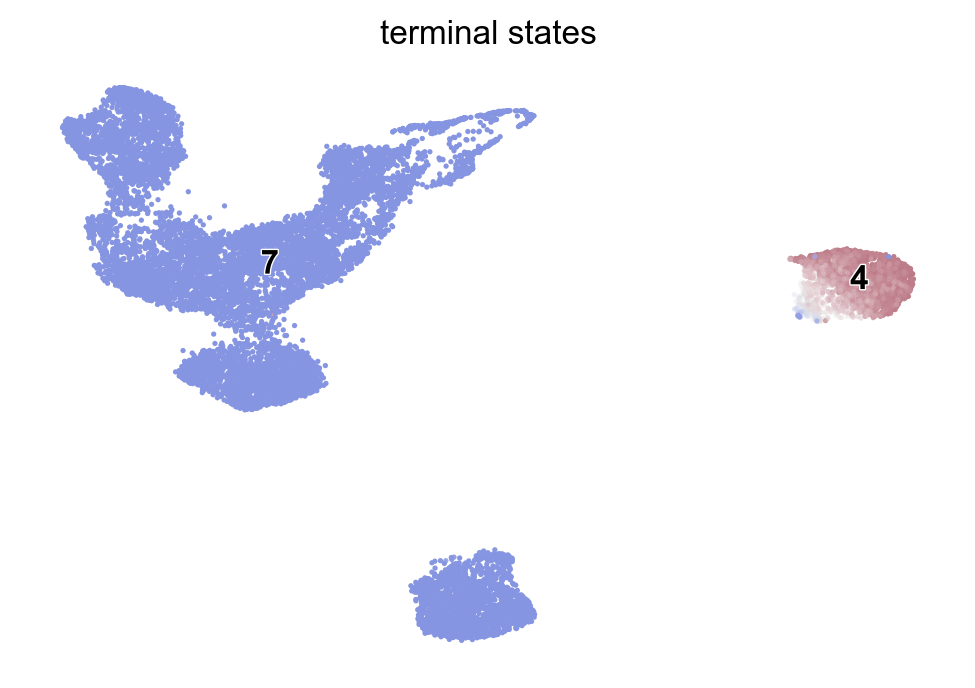

In [13]:
cr.pl.terminal_states(adata)

In [87]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'clusters_gradients', 'terminal_states', 'terminal_states_probs'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u',

In [88]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata)
pk = cr.tl.kernels.PseudotimeKernel(adata)

In [89]:
# Compute a transition matrix
pk.compute_transition_matrix()
vk.compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [00:02<00:00, 6081.92cell/s]
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_utils.py:719: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  G = nx.from_scipy_sparse_matrix(c) if issparse(c) else nx.from_numpy_array(c)


    Finish (0:00:06)
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:37<00:00, 144.32cell/s]


Setting `softmax_scale=15.8728`


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14000/14000 [01:37<00:00, 142.86cell/s]


    Finish (0:03:16)


<VelocityKernel>

In [91]:
# Combining two kernels
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [95]:
combined_kernel = 0.4 * vk + 0.3 *pk + 0.3 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck

In [96]:
# Initialize an estimator
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=14000, kernel=((0.4 * <VelocityKernel[softmax_scale=15.87, mode=deterministic, seed=54680, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.3 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000029e+00 1.4121214905912197e-03 -7.1570755548130511e-03 6.0533319684477997e-03 -7.4922208607531224e-03 3.2575552293414390e-05 4.6099874942550998e-03 -1.4442897265989111e-03 
0.0000000000000000e+00 9.9657389695685672e-01 -4.2298920927265867e-03 5.0146088552519893e-03 -2.9283165407463529e-03 -9.4491766267698933e-04 -2.3084798348196253e-03 8.8715294602522256e-04 
0.0000000000000000e+00 0.0000000000000000e+00 9.9390072920769268e-01 3.9315520956755270e-03 6.5396429448307857e-03 8.8147183213961450e-03 9.8639412289837688e-03 8.8960034464159576e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.8686395577781028e-01 -1.7418424030010815e-02 -6.0205794353604880e-03 -3.2809052792388167e-02 8.1144360084133040e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.8200916973353491e-01 -2.5647561117614969e-02 -2.5509750512410074e-02 1.7735888632

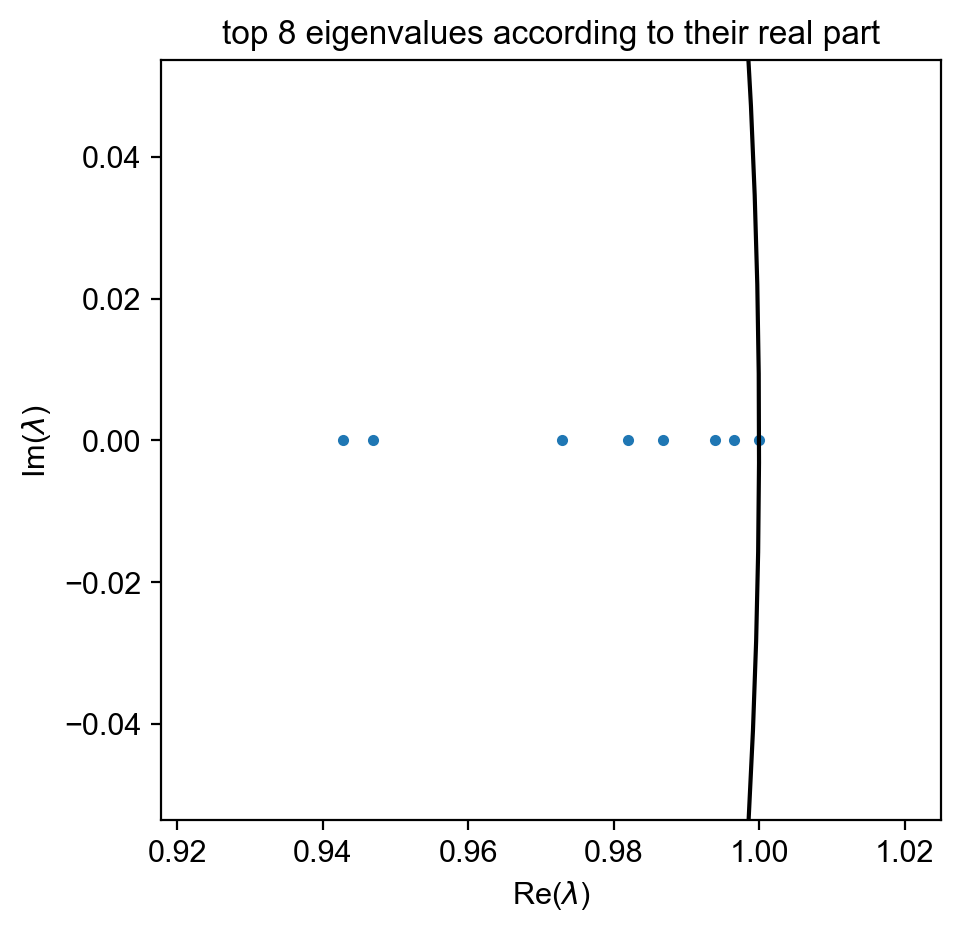

In [97]:
# Compute a matrix decomposition
g.compute_schur(n_components=8) # method with 'brandts', otherwise kernel will be killed; take really a long time for 40k cells 
g.plot_spectrum()

Computing `8` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:07)


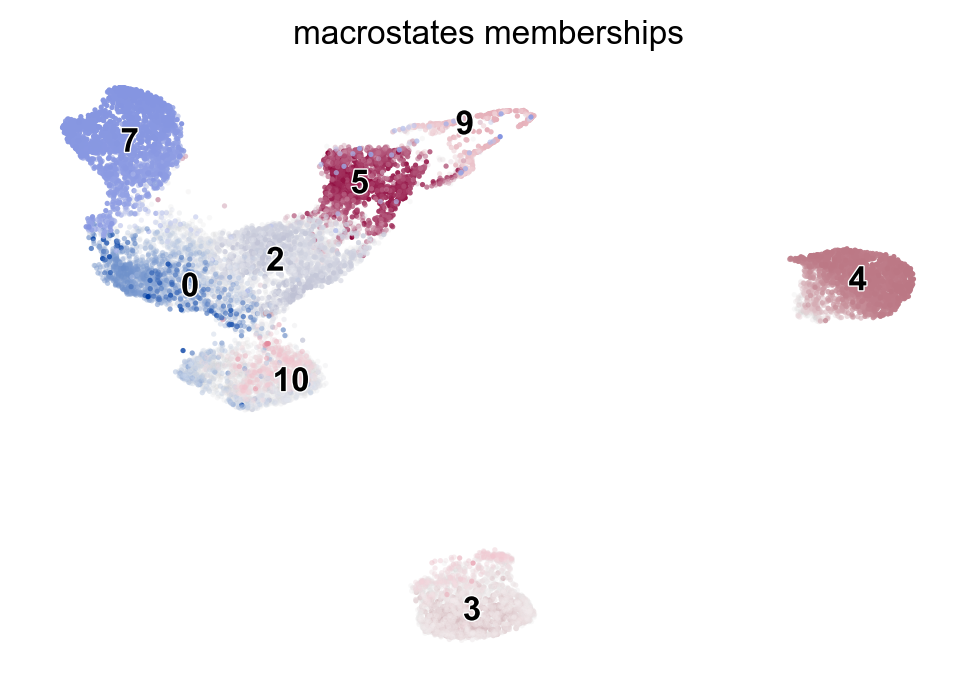

In [98]:
# Infer terminal states
g.compute_macrostates(n_states = 8, cluster_key="clusters")
g.plot_macrostates(same_plot=False, discrete=True)

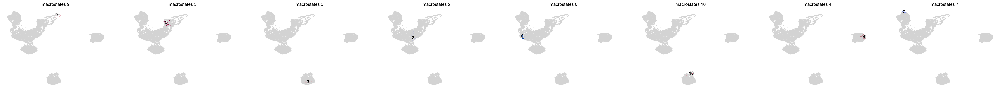

In [99]:
g.plot_macrostates(same_plot=False, discrete=True)

In [105]:
g.set_terminal_states({"Neurons": adata[adata.obs["clusters"] == "9"].obs_names}, add_to_existing=False)
g.set_terminal_states({"FP": adata[adata.obs["clusters"] == "7"].obs_names}, add_to_existing=True)

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [106]:
#g.set_initial_states({"day2": adata[adata.obs["clusters"] == "4"].obs_names}, add_to_existing=True)

AttributeError: 'GPCCA' object has no attribute 'set_initial_states'

Computing absorption probabilities


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 13.69/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


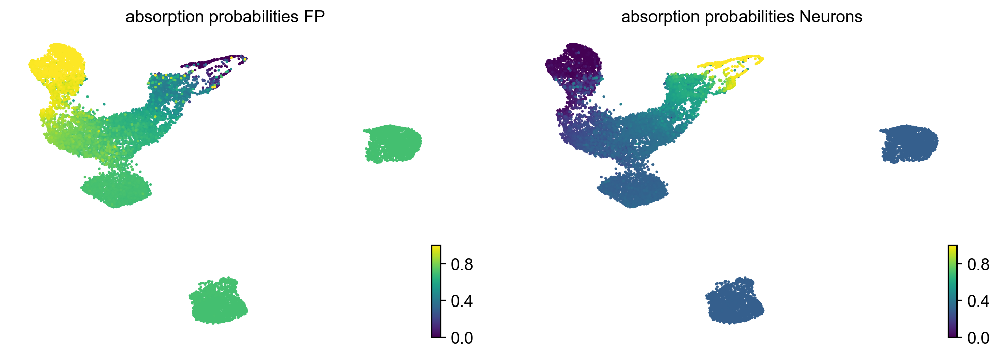

In [107]:
g.compute_absorption_probabilities();g.plot_absorption_probabilities(discrete = True, same_plot = False)

In [108]:
adata

AnnData object with n_obs × n_vars = 14000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'clusters_gradients', 'terminal_states'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likeli

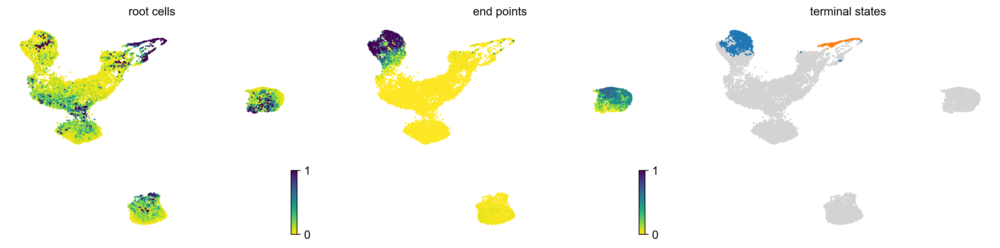

In [113]:
scv.pl.scatter(adata, color=['root_cells', 'end_points', 'terminal_states'])

In [111]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '4')[0];

In [112]:
scv.tl.latent_time(adata, root_key = 'iroot', end_key = 'terminal_states')

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root cell 0, terminal_states as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


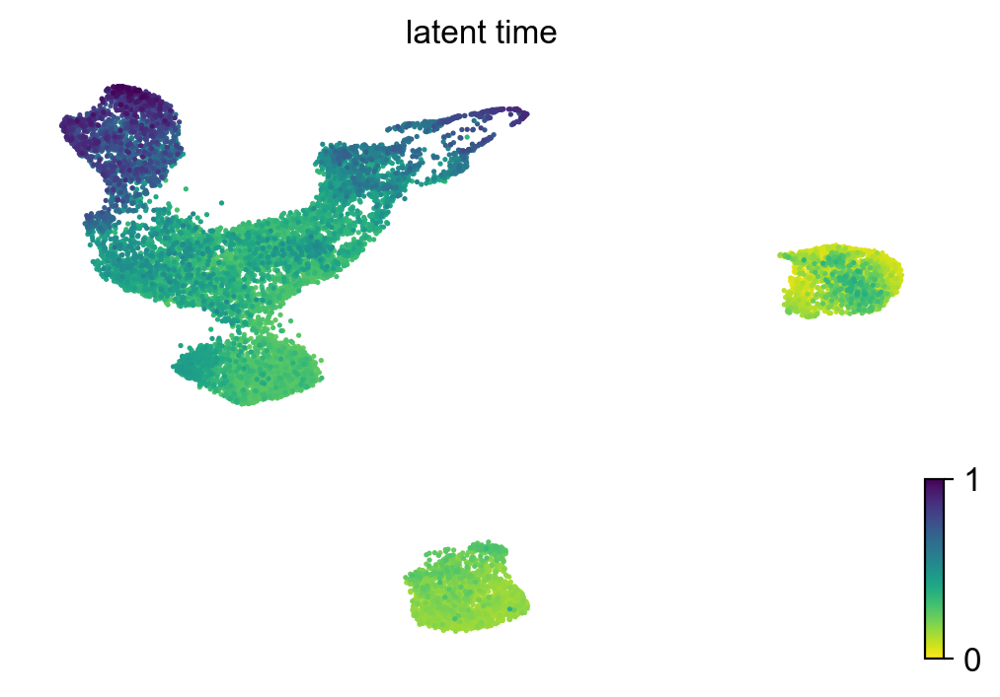

In [114]:
scv.pl.scatter(adata, basis="umap", c="latent_time")